<!--TABLE OF CONTENTS-->
<b>Contents:</b>
- [1.  Прогнозирование заказов такси](#1.--Прогнозирование-заказов-такси)
  - [1.1. Подготовка](#1.1.-Подготовка)
    - [1.1.1. Импорты](#1.1.1.-Импорты)
    - [1.1.2. Загрузка данных](#1.1.2.-Загрузка-данных)
  - [1.2. Анализ и преобразование датасета](#1.2.-Анализ-и-преобразование-датасета)
    - [1.2.1. Дополнительные признаки](#1.2.1.-Дополнительные-признаки)
    - [1.2.2. EDA](#1.2.2.-EDA)
    - [1.2.3. Тренды и сезонность](#1.2.3.-Тренды-и-сезонность)
    - [1.2.4. Вывод](#1.2.4.-Вывод)
  - [1.3. Обучение](#1.3.-Обучение)
    - [1.3.1. Разбиение данных на обучающую и тестовую выборки](#1.3.1.-Разбиение-данных-на-обучающую-и-тестовую-выборки)
    - [1.3.2. Сборка пайплайна](#1.3.2.-Сборка-пайплайна)
    - [1.3.3. Проверка модели на адекватность](#1.3.3.-Проверка-модели-на-адекватность)
    - [1.3.4. LGBMRegressor](#1.3.4.-LGBMRegressor)
    - [1.3.5. DecisionTreeRegressor](#1.3.5.-DecisionTreeRegressor)
    - [1.3.6. LinearRegression](#1.3.6.-LinearRegression)
    - [1.3.7. RandomForestRegressor](#1.3.7.-RandomForestRegressor)
    - [1.3.8. Вывод](#1.3.8.-Вывод)
  - [1.4. Тестирование](#1.4.-Тестирование)
  - [1.5. Выводы](#1.5.-Выводы)

# 1.  Прогнозирование заказов такси


Нужно спрогнозировать количество заказов такси на следующий час. Постройте модель для такого предсказания. Значение метрики *RMSE* на тестовой выборке должно быть не больше 48.

Вам нужно:

1. Загрузить данные и выполнить их ресемплирование по одному часу.
2. Проанализировать данные.
3. Обучить разные модели с различными гиперпараметрами. Сделать тестовую выборку размером 10% от исходных данных.
4. Проверить данные на тестовой выборке и сделать выводы.


<b>Описание данных</b><div class="paragraph">Данные лежат в файле <code class="code-inline code-inline_theme_light">/datasets/taxi.csv</code>. </div><div class="paragraph">Количество заказов находится в столбце '<em>num_orders</em>' (от англ. <em>number of orders</em>, «число заказов»).</div>

## 1.1. Подготовка


### 1.1.1. Импорты


In [1]:
try:
    %load_ext lab_black
except:
    "no lab_black"

In [2]:
!pip install lightgbm --quiet

In [3]:
!pip install feature-engine --quiet

In [4]:
!pip install sweetviz --quiet

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

import sweetviz

from statsmodels.tsa.seasonal import seasonal_decompose

from feature_engine.selection import DropFeatures
from feature_engine.outliers import Winsorizer

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler,
    PowerTransformer,
)
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector

from sklearn.base import BaseEstimator, TransformerMixin

from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor

from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV

from sklearn.metrics import mean_squared_error

### 1.1.2. Загрузка данных


In [6]:
data = pd.read_csv("/datasets/taxi.csv")
data_original = data.copy()

## 1.2. Анализ и преобразование датасета


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26496 entries, 0 to 26495
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   datetime    26496 non-null  object
 1   num_orders  26496 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 414.1+ KB


In [8]:
data.head(10)

,datetime,num_orders
0,2018-03-01 00:00:00,9
1,2018-03-01 00:10:00,14
2,2018-03-01 00:20:00,28
3,2018-03-01 00:30:00,20
4,2018-03-01 00:40:00,32
5,2018-03-01 00:50:00,21
6,2018-03-01 01:00:00,7
7,2018-03-01 01:10:00,5
8,2018-03-01 01:20:00,17
9,2018-03-01 01:30:00,12


Установим дату-время индексом датасета:

In [9]:
data["datetime"] = pd.to_datetime(data["datetime"], infer_datetime_format=True)
data.set_index("datetime", inplace=True)
data.sort_index(inplace=True)

Посмотрим какой временной промежуток используется в данных:

In [10]:
print("All data time period:", data.index.min(), " - ", data.index.max())

All data time period: 2018-03-01 00:00:00  -  2018-08-31 23:50:00


Видим, что данные семплированы по 10 минут, ресемплируем их по одному часу:

In [11]:
data = data.resample("1H").sum()

### 1.2.1. Дополнительные признаки


Добавим в датасет части даты, отстающие значения и скользящее среднее, для этого воспользуемся кастомной функцией и классом. Для начала добавим отстающие значения с 1 до 52 часов, чтобы выявить самые коррелирющие с целевым признаком врменный отсутпы.

In [12]:
# function to extract date features from datetime index
def make_features(dataframe, **kwargs):
    df = dataframe.copy()
    lags = kwargs["lags"] if "lags" in kwargs else [1, 24, 48, 72]
    rolling_mean_size = (
        kwargs["rolling_mean_size"] if "rolling_mean_size" in kwargs else 5
    )

    # df['year'] = df.index.year
    # only one year in data

    # df["month"] = df.index.month
    # no cyclic months change because one year only, and not all months for the year in dataset

    df["hour"] = df.index.hour
    df["day"] = df.index.day
    df["dayofweek"] = df.index.dayofweek

    for lag in lags:
        df["lag_{}".format(lag)] = df["num_orders"].shift(lag)

    # rolling mean shifted to not use current value
    df["rolling_mean"] = df["num_orders"].rolling(rolling_mean_size).mean().shift()
    return df

In [13]:
class DataframeFunctionTransformer(TransformerMixin):
    def __init__(self, func, **kwargs):
        self.func = func
        self.args = kwargs

    def transform(self, input_df, **transform_params):
        return self.func(input_df, **self.args)

    def fit(self, X, y=None, **fit_params):
        return self

### 1.2.2. EDA


Отстающие значения 1-52 часа для анализа и выявления корреляций:

In [14]:
lags_in_hours_analyse = list(range(1, 52))

In [15]:
features_maker_analyse = DataframeFunctionTransformer(
    make_features, lags=lags_in_hours_analyse, rolling_mean_size=7
)

In [16]:
data_eda = features_maker_analyse.fit_transform(data)

Посмотрим на получившиеся признаки и их влияние на целевой признак:

                                             |                                              | [  0%]   00:00 -…


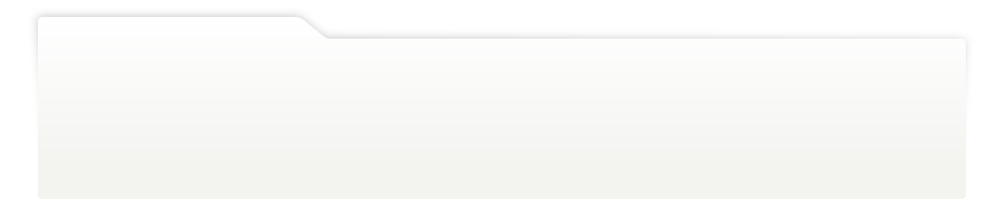
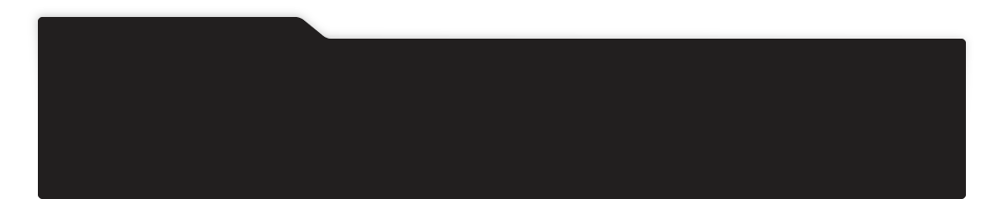
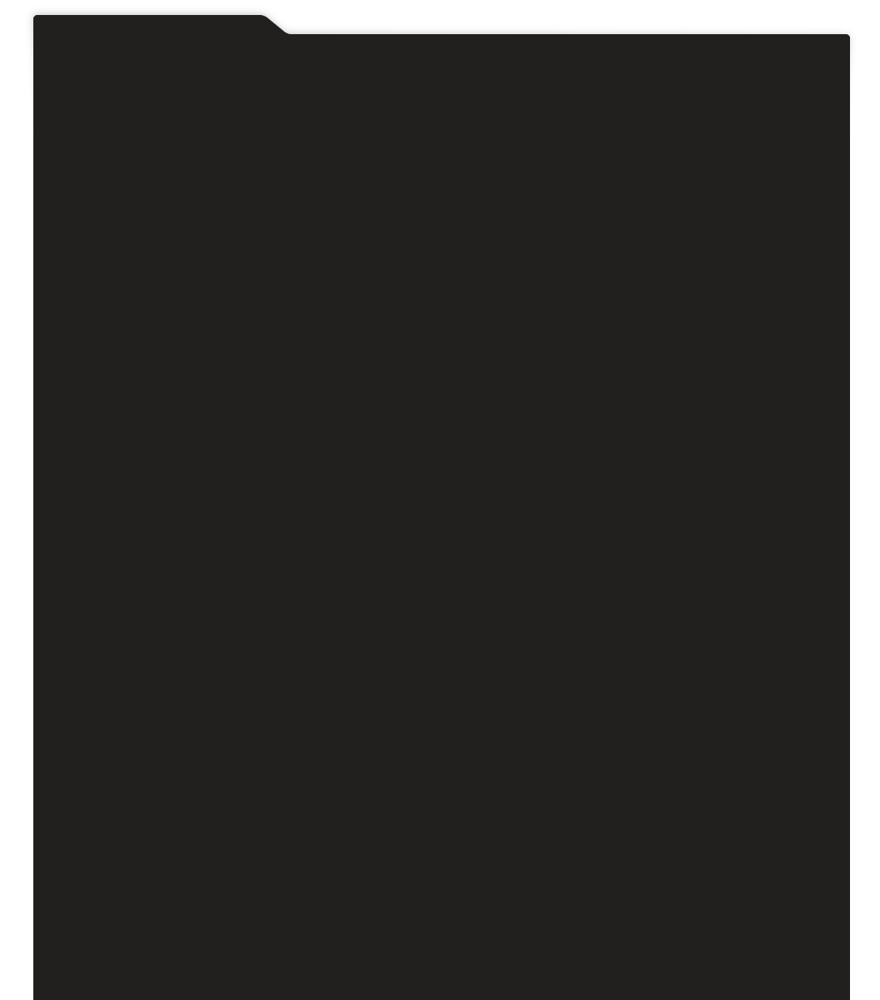
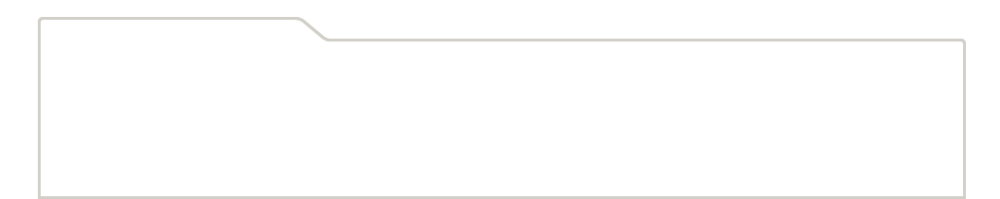
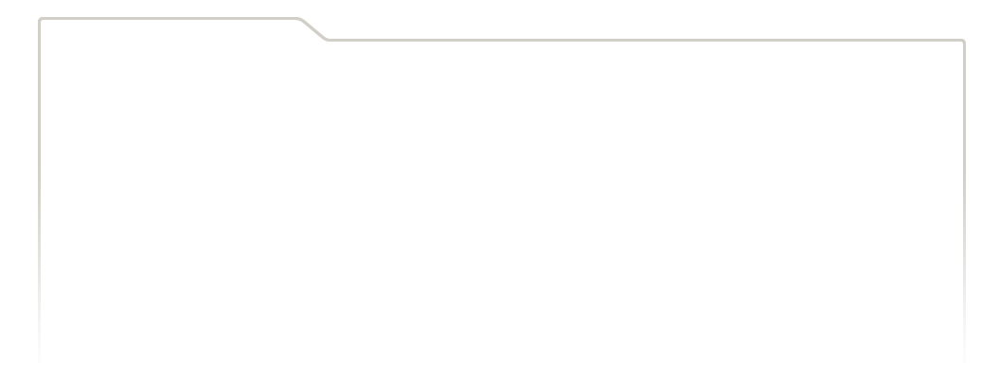
...
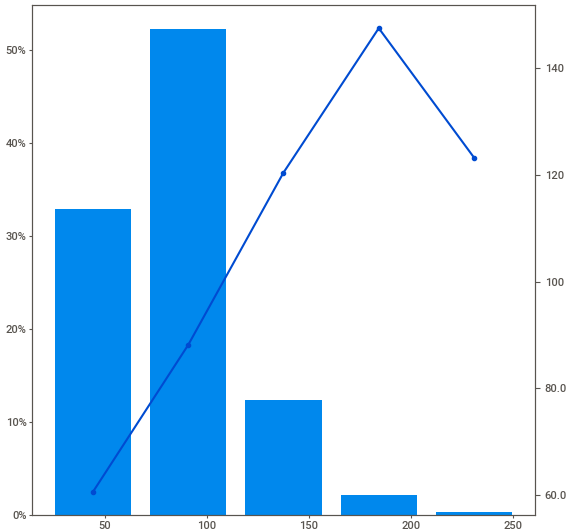
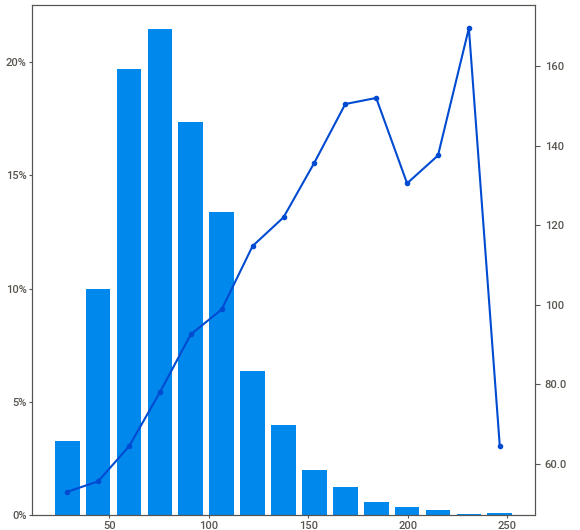
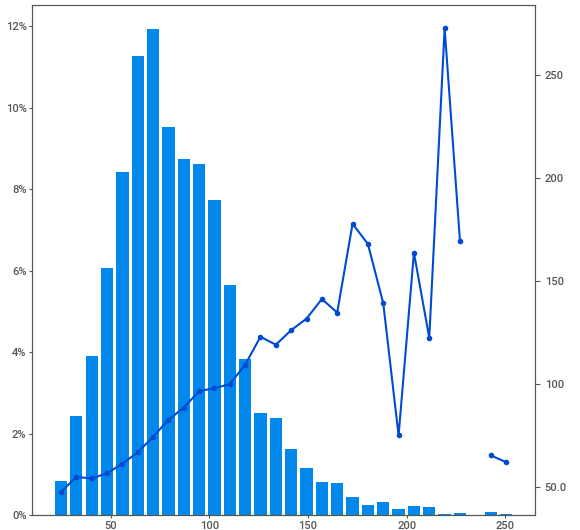
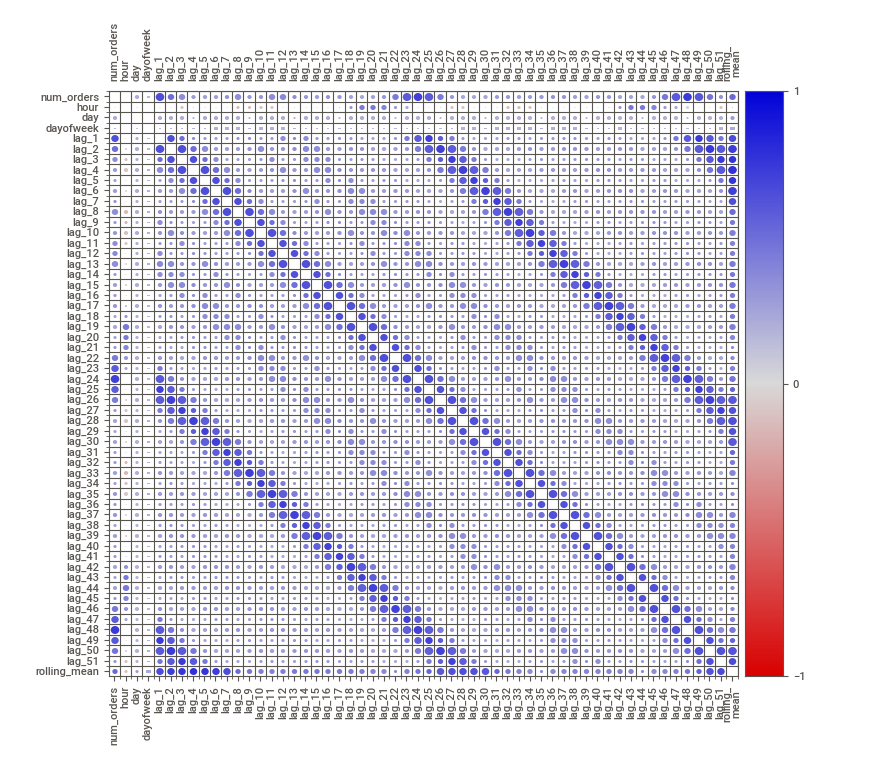
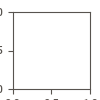

In [17]:
full_report = sweetviz.analyze(data_eda, "num_orders")
full_report.show_notebook()

Отстающие значения выбираем следующим образом: наиболее коррелирующие с целевым признаком (отстающие на 1 час, 1,2...14 дней +- 1 час), что мы видим в EDA отчете выше. Если брать отстающие значения между этими временными отступами, то корреляция с целевым признаком получается у них низкой.

In [18]:
lags_in_hours = [1]
[
    (
        lags_in_hours.append(24 * x - 1),
        lags_in_hours.append(24 * x),
        lags_in_hours.append(24 * x + 1),
    )
    for x in [1, 2, 3, 4, 5, 6, 7, 14]  # lags in days
]
lags_in_hours

[1,
 23,
 24,
 25,
 47,
 48,
 49,
 71,
 72,
 73,
 95,
 96,
 97,
 119,
 120,
 121,
 143,
 144,
 145,
 167,
 168,
 169,
 335,
 336,
 337]

In [19]:
features_maker = DataframeFunctionTransformer(
    make_features, lags=lags_in_hours, rolling_mean_size=7
)

In [20]:
data = features_maker.fit_transform(data)

Приведем месяц, день месяца и недели к категориальному типу признаков:

In [21]:
# data.loc[:, ["month"]] = pd.Categorical(data["month"])
data.loc[:, ["day"]] = pd.Categorical(data["day"])
data.loc[:, ["dayofweek"]] = pd.Categorical(data["dayofweek"])

Еще раз проверяем, что выбраны нужные признаки:

                                             |                                              | [  0%]   00:00 -…


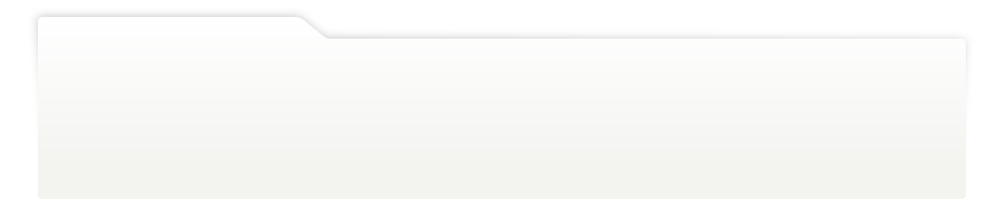
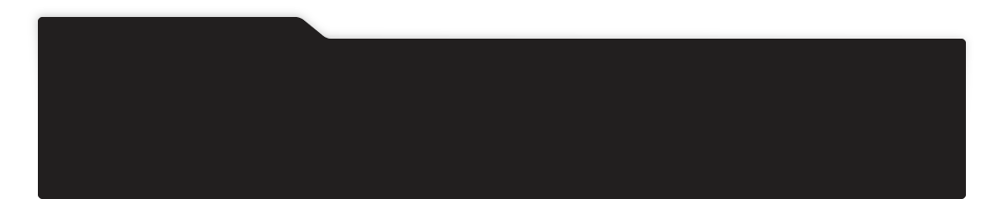
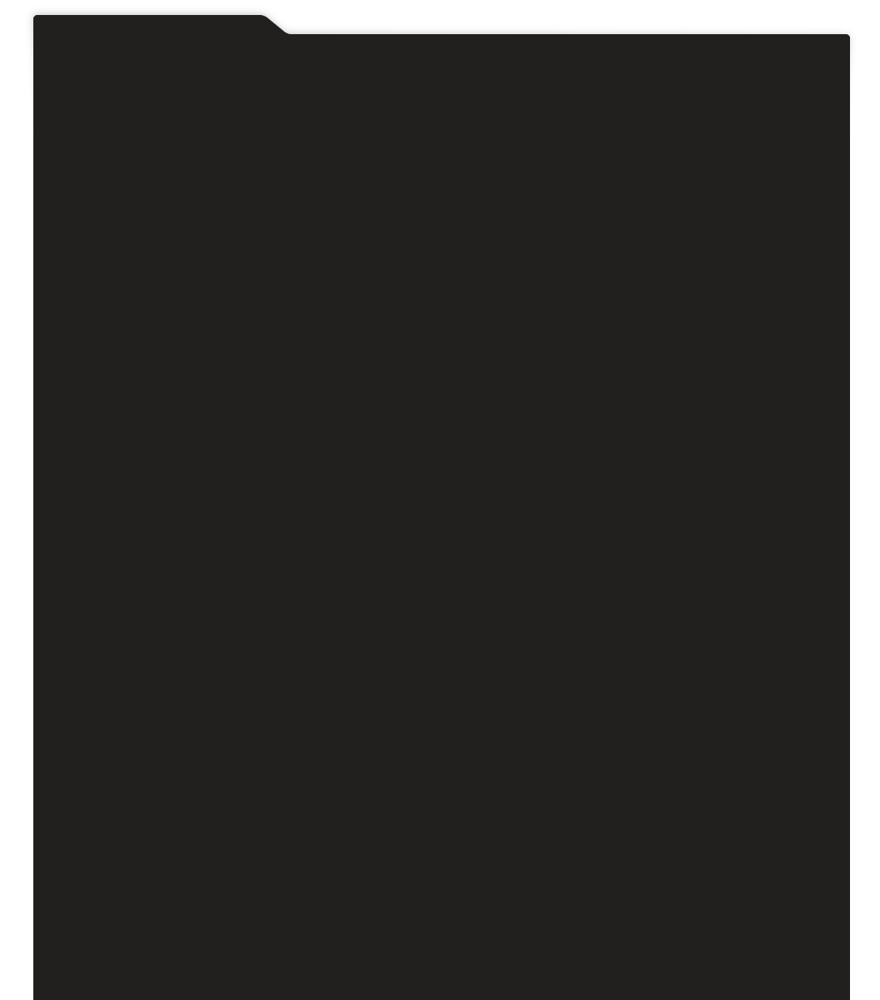
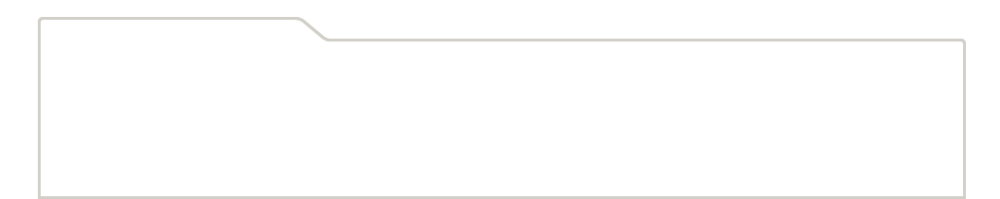
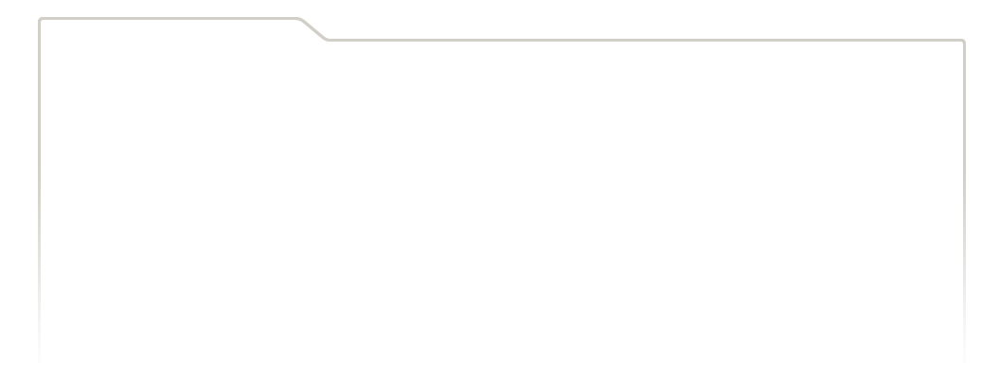
...
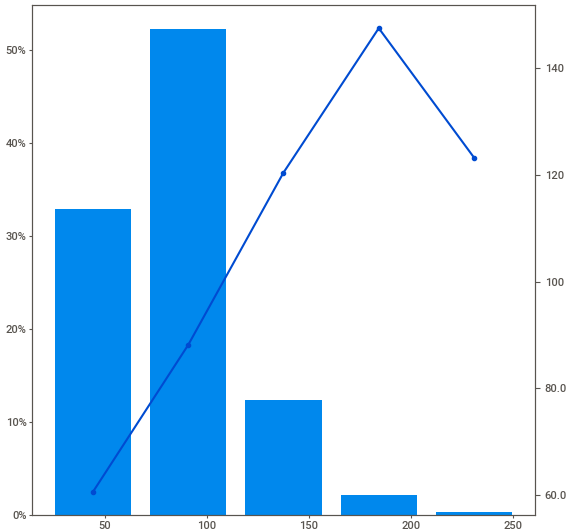
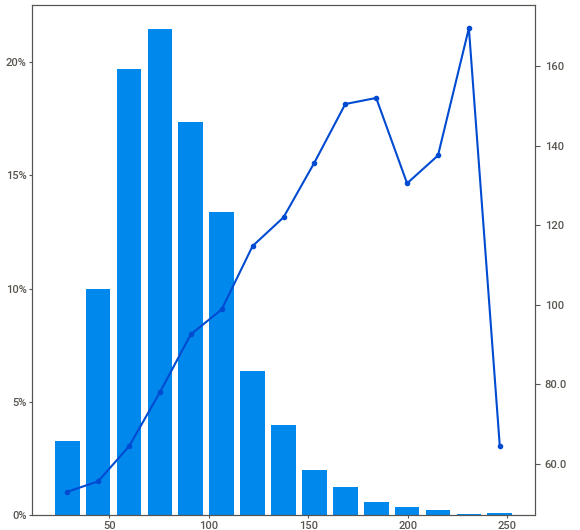
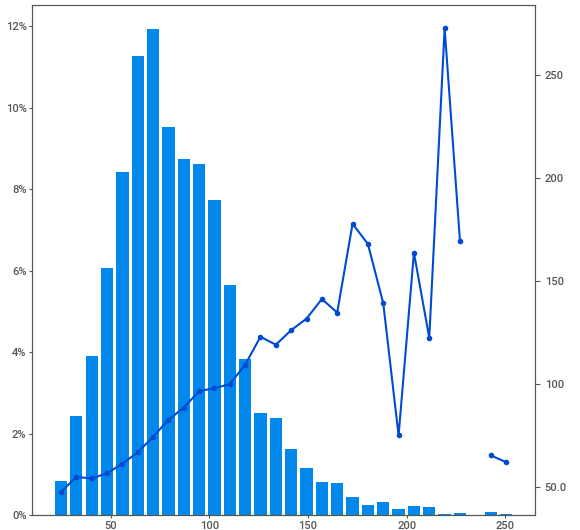
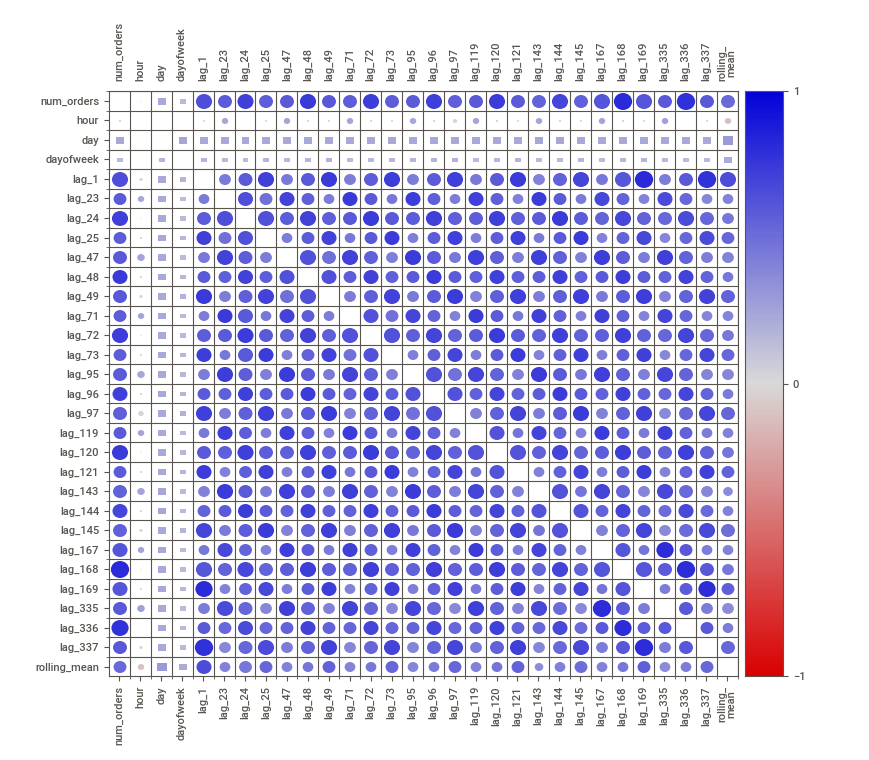
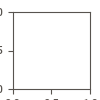

In [22]:
full_report = sweetviz.analyze(data, "num_orders")
full_report.show_notebook()

Видим, что многие из добавленных признаков имеют достаточно высокий уровень корреляции с целевым признаком.

Построим ящики с усами для признаков, чтобы увидеть наличие выбросов:

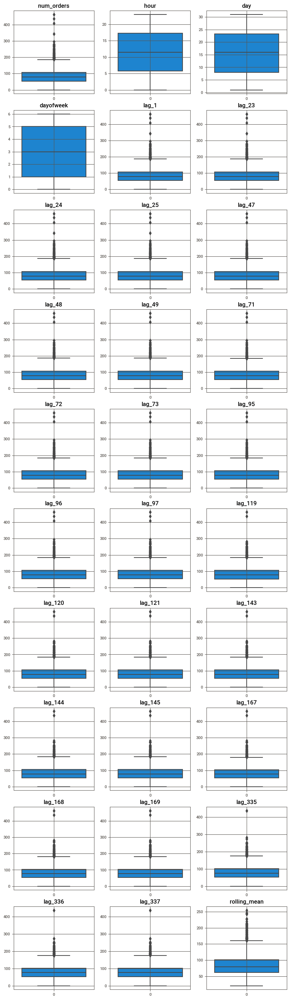

In [23]:
fig, ax = plt.subplots(10, 3, figsize=(10, 36))
ax = ax.flatten()
for i, col in enumerate(
    data.select_dtypes(exclude=["object", "datetime64[ns]"]).columns
):
    sns.boxplot(data=data[col], ax=ax[i])
    ax[i].grid()
    ax[i].set_title(col)
    max_i = i
for i in range(max_i + 1, len(ax)):
    fig.delaxes(ax[i])
plt.show()

Видим наличие выбросов у num_orders и у сгенерирированных на его основе признаков. Будем использовать Winsorizer из библиотеки feature engine для обработки этих выбросов в pipeline.

Удалим записи где нет данных для отстающих значений и для скользящего среднего:

In [24]:
data = data.dropna()

### 1.2.3. Тренды и сезонность


Посмотрим на тренды и сезонность в наших временных рядах:

In [25]:
decomposed = seasonal_decompose(data["num_orders"].resample("1D").sum())

Видим возрастающий (с большим числом колебаний, с ускорением в сентябрьский период) на протяжении имеющегося временного промежутка. Достаточно сложный график для предсказания моделью.

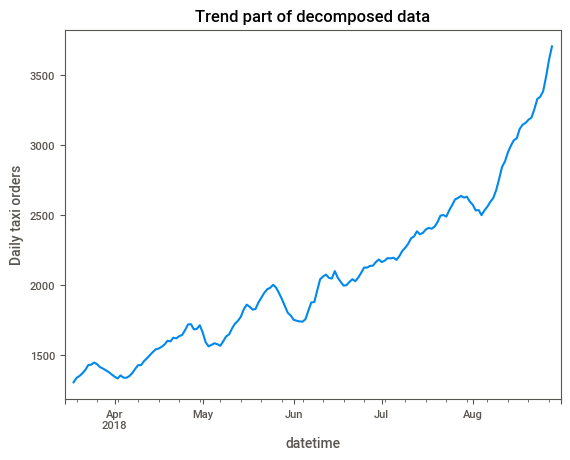

In [26]:
decomposed.trend.plot()
plt.ylabel("Daily taxi orders")
plt.title("Trend part of decomposed data")
plt.show()

Проанализируем сезонные явления в наших временных рядах:

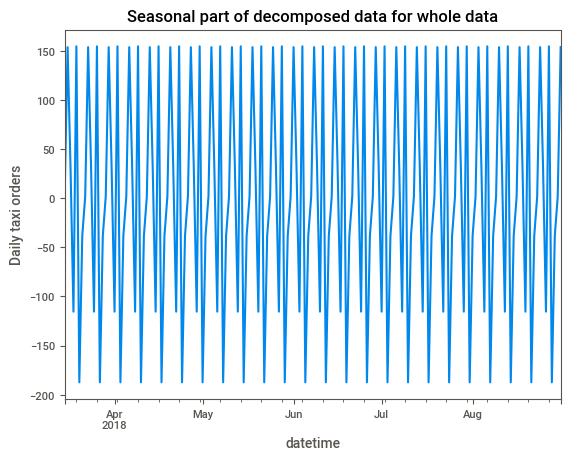

In [27]:
decomposed.seasonal.plot()
plt.ylabel("Daily taxi orders")
plt.title("Seasonal part of decomposed data for whole data")
plt.show()

Посмотрим поближе и увидим, что это сезонные явления привязанные к дням недели (например, пики в понедельники 2, 9, 16, 23 апреля 2018г.):

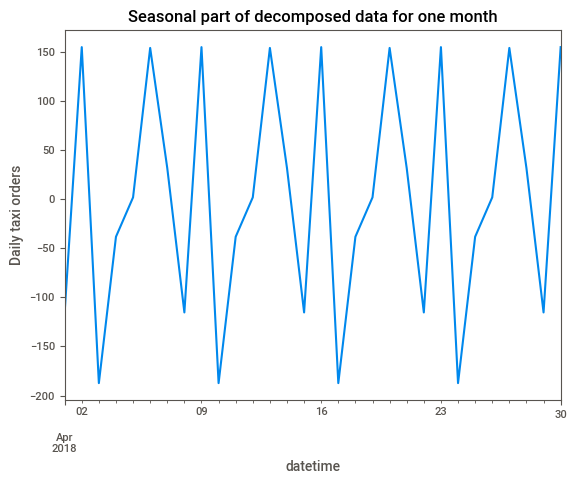

In [28]:
decomposed.seasonal["2018-04":"2018-04-30"].plot()
plt.ylabel("Daily taxi orders")
plt.title("Seasonal part of decomposed data for one month")
plt.show()

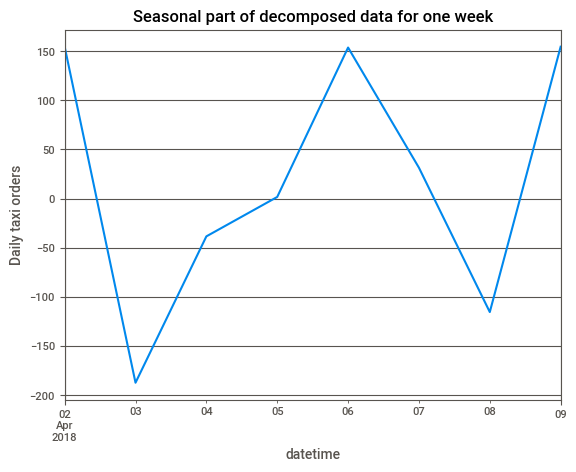

In [29]:
decomposed.seasonal["2018-04-02":"2018-04-09"].plot()
plt.ylabel("Daily taxi orders")
plt.title("Seasonal part of decomposed data for one week")
plt.grid()
plt.show()

И остаток декомпозиции не входящий в тренд и сезонность:

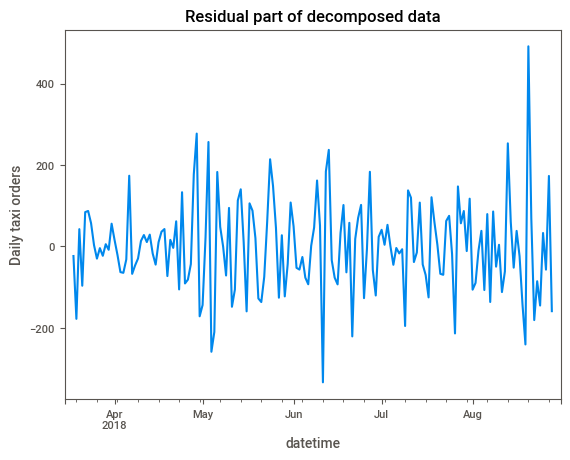

In [30]:
decomposed.resid.plot()
plt.ylabel("Daily taxi orders")
plt.title("Residual part of decomposed data")
plt.show()

А также посмотрим на сезонную часть по часовым суммам заказов за один день:

In [31]:
decomposed2 = seasonal_decompose(data["num_orders"].resample("1H").sum())

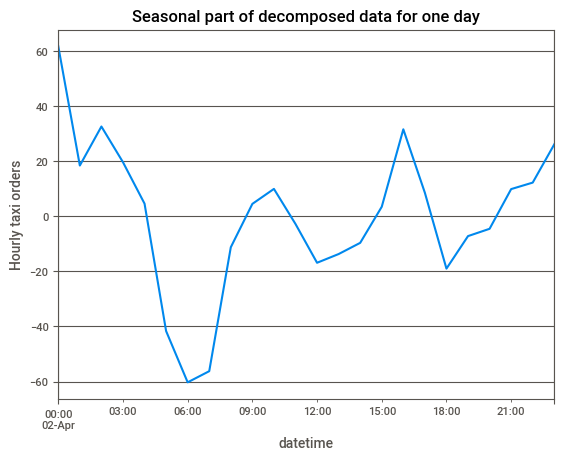

In [32]:
decomposed2.seasonal["2018-04-02":"2018-04-02"].plot()
plt.ylabel("Hourly taxi orders")
plt.title("Seasonal part of decomposed data for one day")
plt.grid()
plt.show()

Или на почасовом boxenplot графике ниже мы также видим, возрастающее число заказов в поздне-вечерние и ночные часы с самыми большими выбросами в 2 часа ночи. Чуть меньшие повышения среднего числа заказов в утрение 8-9-10 часов и дневные 15-16-17 часов.

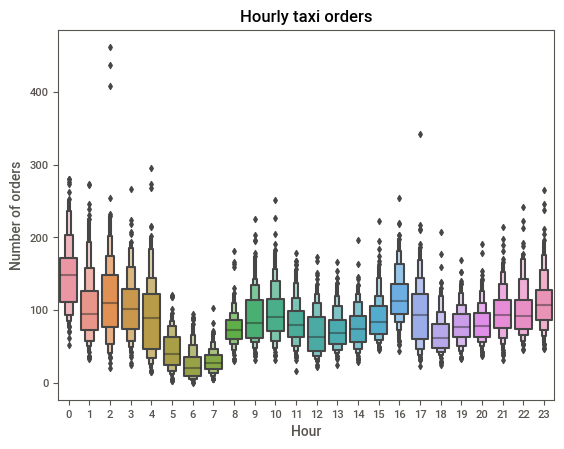

In [33]:
sns.boxenplot(x=data.index.hour, y="num_orders", data=data)
plt.title("Hourly taxi orders")
plt.xlabel("Hour")
plt.ylabel("Number of orders")
plt.show()

Псмотрим есть ли аналогичные зависимости по дням недели:

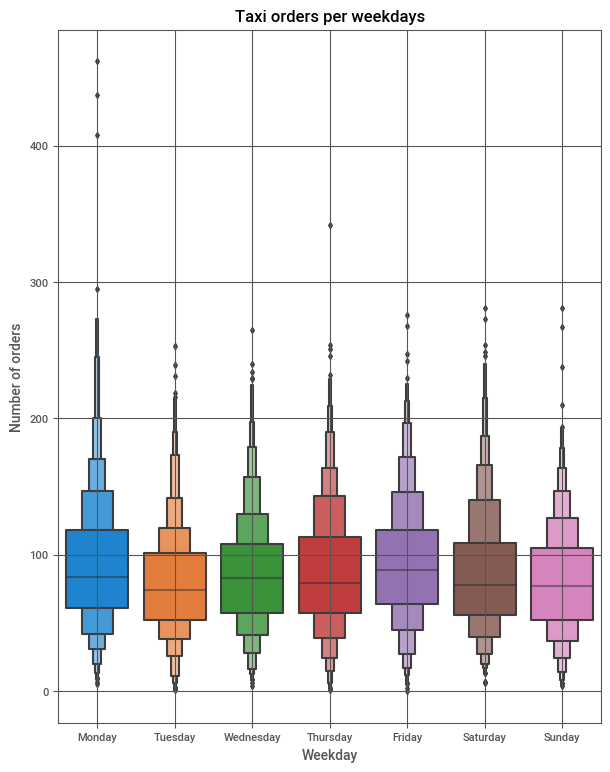

In [34]:
plt.subplots(figsize=(7, 9))
fig = sns.boxenplot(x="dayofweek", y="num_orders", data=data)
plt.title("Taxi orders per weekdays")
plt.xlabel("Weekday")
plt.xticks(
    ticks=fig.get_xticks(),
    labels=[
        "Monday",
        "Tuesday",
        "Wednesday",
        "Thursday",
        "Friday",
        "Saturday",
        "Sunday",
    ],
)
plt.ylabel("Number of orders")
plt.grid()
plt.show()

По дням недели такой однозначной зависимости нет, больше всего заказов такси в среднем в пятницу, на втором месте по числу заказов - понедельник (и самые большие выбросы в понедельник), на третьем - среда. Меньше всего заказов в среднем во вторник.

### 1.2.4. Вывод


Проанализировав временные ряды, заданный временной диапазон, сезонность данных, тренд,  мы подобрали новые признаки для добавления в датасет:
* часы
* день недели
* день месяца
* отстающие значения для 1 часа и 1, 2, 3, 4, 5, 6, 7, 14 дней
* скользящее среднее

Месяц, год нам не подходят как признаки из-за ограниченного временного отрезка нашего датасета (меньше года)

## 1.3. Обучение


### 1.3.1. Разбиение данных на обучающую и тестовую выборки


Прежде чем проводить следующие преобразования данных разобьем данные применив `train_test_split(...)` выключив shuffle чтобы тестовая выборка начиналась после обучающей:
* обучающая - 90% строк
* тестовая - 10% строк

In [35]:
data_train, data_test = train_test_split(
    data, shuffle=False, test_size=0.1, random_state=7_01_23
)
print("Total records count:", data.shape[0])
print("Train records count:", data_train.shape[0])
print("Test records count:", data_test.shape[0])
print("Train records last index:", data_train.index[-1])
print("Test records first index:", data_test.index[0])

Total records count: 4079
Train records count: 3671
Test records count: 408
Train records last index: 2018-08-14 23:00:00
Test records first index: 2018-08-15 00:00:00


Кроме того нужно сделать пропуск между обучающей и тестовой выборкой, иначе будет утечка данных из-за отстающих значений и скользящего среднего. Удалим  последниt элементов из обучающего датасета, которые влияют на тестовые даные:

In [36]:
gap_in_hours = max(lags_in_hours)

In [37]:
data_train = data_train.drop(data_train.iloc[-gap_in_hours:].index)

In [38]:
print("Train records last index:", data_train.index[-1])
print("Test records first index:", data_test.index[0])

Train records last index: 2018-07-31 22:00:00
Test records first index: 2018-08-15 00:00:00


Скопируем data_train в data_train_original, чтобы иметь необработанную копию данных для обучения

In [39]:
data_train_original = data_train.copy()

In [40]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4079 entries, 2018-03-15 01:00:00 to 2018-08-31 23:00:00
Freq: H
Data columns (total 30 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   num_orders    4079 non-null   int64   
 1   hour          4079 non-null   int64   
 2   day           4079 non-null   category
 3   dayofweek     4079 non-null   category
 4   lag_1         4079 non-null   float64 
 5   lag_23        4079 non-null   float64 
 6   lag_24        4079 non-null   float64 
 7   lag_25        4079 non-null   float64 
 8   lag_47        4079 non-null   float64 
 9   lag_48        4079 non-null   float64 
 10  lag_49        4079 non-null   float64 
 11  lag_71        4079 non-null   float64 
 12  lag_72        4079 non-null   float64 
 13  lag_73        4079 non-null   float64 
 14  lag_95        4079 non-null   float64 
 15  lag_96        4079 non-null   float64 
 16  lag_97        4079 non-null   float64 
 17  lag_119 

### 1.3.2. Сборка пайплайна


Сделаем пайплайны для обработки признаков:

In [41]:
# categorial feature pipeline
cat_pipe = Pipeline(
    [
        (
            "encoder",
            None,
        ),
        # ("imputer", SimpleImputer(strategy="most_frequent")),
        ("scaler", None),
    ]
)

# numeric features pipeline
num_pipe = Pipeline(
    [
        ("scaler", None),
        # ("dbg_num4", Debug()),
    ]
)

# applying num_pipe to dynamically selecting numeric types
transformer = ColumnTransformer(
    transformers=[
        ("num", num_pipe, make_column_selector(dtype_include=np.number)),
        ("cat", cat_pipe, make_column_selector(dtype_exclude=np.number)),
    ],
    remainder="drop",
    n_jobs=-1,
)

In [42]:
class ModelSwitcher(BaseEstimator):
    def __init__(
        self,
        estimator=RandomForestRegressor(),
    ):
        """
        A Custom BaseEstimator that can switch between models.
        :param estimator: sklearn object - The model
        """

        self.estimator = estimator

    def fit(self, X, y=None, **kwargs):
        self.estimator.fit(X, y)
        return self

    def predict(self, X, y=None):
        return self.estimator.predict(X)

    # @available_if(self.is_classifier(estimator))
    # def predict_proba(self, X):
    #     return self.estimator.predict_proba(X)

    def score(self, X, y):
        return self.estimator.score(X, y)

In [43]:
pipeline = Pipeline(
    [
        # ("feature_creation_pipe", feature_creation_pipe),
        # ("dbg0", Debug()),
        # ("drop_missing", DropMissingData()),
        ("drop", None),
        ("transformer", transformer),
        # ("dbg3", Debug()),
        ("model", ModelSwitcher()),
    ]
)

In [44]:
pipeline.get_params()

{'memory': None,
 'steps': [('drop', None),
  ('transformer', ColumnTransformer(n_jobs=-1,
                     transformers=[('num', Pipeline(steps=[('scaler', None)]),
                                    <sklearn.compose._column_transformer.make_column_selector object at 0x7fd9f0544b20>),
                                   ('cat',
                                    Pipeline(steps=[('encoder', None),
                                                    ('scaler', None)]),
                                    <sklearn.compose._column_transformer.make_column_selector object at 0x7fd9f0544340>)])),
  ('model', ModelSwitcher())],
 'verbose': False,
 'drop': None,
 'transformer': ColumnTransformer(n_jobs=-1,
                   transformers=[('num', Pipeline(steps=[('scaler', None)]),
                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7fd9f0544b20>),
                                 ('cat',
                                  Pipeline(steps=

Выделим целевой и остальные признаки: 

In [45]:
X = data_train.drop("num_orders", axis=1)
y = data_train["num_orders"]

### 1.3.3. Проверка модели на адекватность


In [46]:
pred_previous = data_test["num_orders"].shift(
    fill_value=data_train["num_orders"].iloc[-1]
)

In [47]:
mean_squared_error(
    data_test["num_orders"],
    pred_previous,
    squared=False,
)

59.44615705186748

Для константной модели предсказывающей предыдущим значением получаем RMSE на уровне 60.

### 1.3.4. LGBMRegressor


Перебираемые гиперпараметры и модели:

In [48]:
parameters = [
    {
        "model__estimator": [
            LGBMRegressor(random_state=7_01_23)
            # learning_rate=0.17, n_estimators=300,
        ],
        "model__estimator__n_estimators": list(range(20, 601, 10)),
        "model__estimator__learning_rate": [x / 1000.0 for x in range(100, 190, 5)],
    },
]

Будем использовать перебор параметров с помощью RandomizedSearchCV c ограниченным числом итераций (n_iter), в качестве разбиения для кроссвалидации используем TimeSeriesSplit(gap=gap_in_hours) с пропуском в максимальное число записей используемых в lag-признаках:

In [49]:
rand_search_cv_lgbm = RandomizedSearchCV(
    pipeline,
    parameters,
    n_iter=10,
    cv=TimeSeriesSplit(gap=gap_in_hours),
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
    random_state=7_01_23,
)

Обучаем:

In [50]:
%%time
rand_search_cv_lgbm.fit(X, y)
print()


CPU times: user 868 ms, sys: 720 ms, total: 1.59 s
Wall time: 3.73 s


Смотрим на лучшую модель:

In [51]:
rand_search_cv_lgbm.best_estimator_

Pipeline(steps=[('drop', None),
                ('transformer',
                 ColumnTransformer(n_jobs=-1,
                                   transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   None)]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7fda6df6e040>),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   None),
                                                                  ('scaler',
                                                                   None)]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7fda6df6e3a0>)])),
                ('model',
                 ModelSwitcher(estimator=LGBMRegressor(learning_rate=0.125,
                                                       n_estimators=50,
                                                       random_state=70123)))])

RMSE лучшей модели умноженное на -1 (для минимизации):

In [52]:
rand_search_cv_lgbm.best_score_

-22.96526446059668

### 1.3.5. DecisionTreeRegressor


In [53]:
parameters_dtr = [
    {
        "model__estimator": [DecisionTreeRegressor(random_state=19_12_22)],
        "model__estimator__max_depth": list(range(3, 17)),
        # do not use absolute_error below - hangs up
        "model__estimator__criterion": [
            "squared_error",
            "friedman_mse",
            "poisson",
        ],
        #         'feature_creation_pipe__add_regions':[None],
        #         'feature_creation_pipe__add_yearly_km':[None],
        #         'feature_creation_pipe__add_date_parts':[None],
    }
]

In [54]:
rand_search_cv_dtr = RandomizedSearchCV(
    pipeline,
    parameters_dtr,
    n_iter=42,
    cv=TimeSeriesSplit(gap=gap_in_hours),
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
    random_state=7_01_23,
)

In [55]:
%%time
rand_search_cv_dtr.fit(X, y)
print()


CPU times: user 486 ms, sys: 61.2 ms, total: 547 ms
Wall time: 1.08 s


In [56]:
rand_search_cv_dtr.best_estimator_

Pipeline(steps=[('drop', None),
                ('transformer',
                 ColumnTransformer(n_jobs=-1,
                                   transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   None)]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7fda6d74e9d0>),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   None),
                                                                  ('scaler',
                                                                   None)]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7fda6d74ea90>)])),
                ('model',
                 ModelSwitcher(estimator=DecisionTreeRegressor(criterion='poisson',
                                                               max_depth=4,
                                                               random_state=191222)))])

In [57]:
rand_search_cv_dtr.best_score_

-25.092222740971742

### 1.3.6. LinearRegression


In [58]:
parameters_linear = [
    {
        "model__estimator": [LinearRegression(n_jobs=-1)],
        "transformer__cat__encoder": [
            OneHotEncoder(drop="first", handle_unknown="infrequent_if_exist"),
            None,
        ],
        "transformer__cat__scaler": [
            StandardScaler(with_mean=False),
            StandardScaler(),
            PowerTransformer(standardize=False),
            PowerTransformer(),
        ],
        "transformer__num__scaler": [
            StandardScaler(with_mean=False),
            StandardScaler(),
            PowerTransformer(standardize=False),
            PowerTransformer(),
        ],
    }
]

In [59]:
rand_search_cv_lin = RandomizedSearchCV(
    pipeline,
    parameters_linear,
    n_iter=50,
    cv=TimeSeriesSplit(gap=7),
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
    random_state=7_01_23,
)

In [60]:
%%time
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    rand_search_cv_lin.fit(X, y)

/home/kaptoh/anaconda3/envs/practicum/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:202: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/kaptoh/anaconda3/envs/practicum/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:202: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/kaptoh/anaconda3/envs/practicum/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:202: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/kaptoh/anaconda3/envs/practicum/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:202: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


CPU times: user 371 ms, sys: 88.3 ms, total: 460 ms
Wall time: 1.47 s


In [61]:
rand_search_cv_lin.best_score_

-21.00466888260001

In [62]:
rand_search_cv_lin.best_estimator_

Pipeline(steps=[('drop', None),
                ('transformer',
                 ColumnTransformer(n_jobs=-1,
                                   transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler(with_mean=False))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7fd9f056f490>),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   None),
                                                                  ('scaler',
                                                                   PowerTransformer(standardize=False))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7fd9f056f3d0>)])),
                ('model',
                 ModelSwitcher(estimator=LinearRegression(n_jobs=-1)))])

In [63]:
rand_search_cv_lin.best_estimator_["model"].estimator.coef_

array([-0.36622486,  2.66734148,  0.38774968,  3.44562533, -0.42033897,
        0.68066705,  3.9049414 ,  0.05125743,  0.3987147 ,  2.85311504,
       -1.30012162, -0.32819106,  3.5199852 , -0.82886352, -0.68109362,
        2.49644987,  0.17180595, -0.92508155, -0.40413102, -0.95088594,
        1.12148493, 10.6975353 ,  1.5612463 ,  0.92629149,  6.23415371,
        0.46129301,  2.13561081,  0.15924507,  0.18217527])

### 1.3.7. RandomForestRegressor 


In [64]:
parameters_rfr = [
    {
        "model__estimator": [RandomForestRegressor(n_jobs=-1, random_state=19_12_22)],
        "model__estimator__n_estimators": list(range(30, 51, 1)),
        "model__estimator__max_depth": list(range(2, 17)),
    },
]

In [65]:
rand_search_cv_rfr = RandomizedSearchCV(
    pipeline,
    parameters_rfr,
    n_iter=10,
    cv=TimeSeriesSplit(gap=gap_in_hours),
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
    random_state=7_01_23,
)

In [66]:
%%time
rand_search_cv_rfr.fit(X, y)
print()


CPU times: user 873 ms, sys: 66.5 ms, total: 940 ms
Wall time: 2.32 s


In [67]:
rand_search_cv_rfr.best_estimator_

Pipeline(steps=[('drop', None),
                ('transformer',
                 ColumnTransformer(n_jobs=-1,
                                   transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   None)]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7fd9f05757f0>),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   None),
                                                                  ('scaler',
                                                                   None)]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7fd9f0575ca0>)])),
                ('model',
                 ModelSwitcher(estimator=RandomForestRegressor(max_depth=6,
                                                               n_estimators=36,
                                                               n_jobs=-1,
                                                               random_state=191222)))])

In [68]:
rand_search_cv_rfr.best_score_

-21.82047215830207

### 1.3.8. Вывод


Посмотрим на результаты наших моделей на графиках:

In [69]:
# aux function to write different data as collection to array to be converted to DataFrame;
def add_model_record(results_array, **kwargs):
    results_array.append(kwargs)

In [70]:
def extract_result_from_gridsearch_cv(rcv_result, model_name, model_results_array):
    cv_results = rcv_result.cv_results_
    best_index = np.where(cv_results["rank_test_score"] == 1)[0][0]
    add_model_record(
        model_results_array,
        model_name=model_name,
        model=rcv_result.best_estimator_,
        mean_test_score=abs(cv_results["mean_test_score"][best_index]),
        std_test_score=cv_results["std_test_score"][best_index],
        mean_fit_time=cv_results["mean_fit_time"][best_index],
        std_fit_time=cv_results["std_fit_time"][best_index],
        mean_score_time=cv_results["mean_score_time"][best_index],
        std_score_time=cv_results["std_score_time"][best_index],
        params=cv_results["params"][best_index],
    )


models_results = []
for rcv_result, model_name in zip(
    [
        rand_search_cv_lgbm,
        rand_search_cv_lin,
        rand_search_cv_dtr,
        rand_search_cv_rfr,
    ],
    [
        "LGBM Regressor",
        "Linear Regressor",
        "Decision Tree Regressor",
        "Random Forest Regressor",
    ],
):
    extract_result_from_gridsearch_cv(rcv_result, model_name, models_results)

In [71]:
models_results_df = pd.DataFrame(models_results)
models_results_df

,model_name,model,mean_test_score,std_test_score,mean_fit_time,std_fit_time,mean_score_time,std_score_time,params
0,LGBM Regressor,"(None, ColumnTransformer(n_jobs=-1,\n ...",22.965264,2.513280,0.113899,0.040790,0.016184,0.003408,"{'model__estimator__n_estimators': 50, 'model_..."
1,Linear Regressor,"(None, ColumnTransformer(n_jobs=-1,\n ...",21.004669,1.940074,0.053049,0.015518,0.023853,0.008456,{'transformer__num__scaler': StandardScaler(wi...
2,Decision Tree Regressor,"(None, ColumnTransformer(n_jobs=-1,\n ...",25.092223,2.310240,0.033865,0.006880,0.012087,0.003379,"{'model__estimator__max_depth': 4, 'model__est..."
3,Random Forest Regressor,"(None, ColumnTransformer(n_jobs=-1,\n ...",21.820472,1.980305,0.294884,0.120726,0.149350,0.112178,"{'model__estimator__n_estimators': 36, 'model_..."


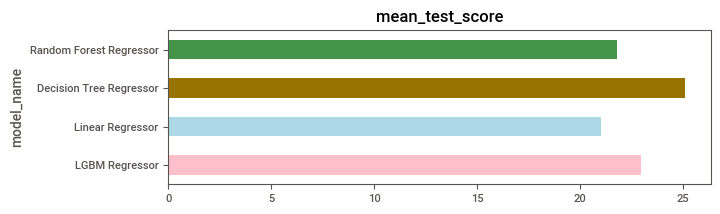

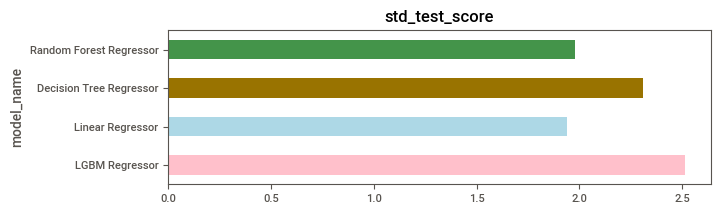

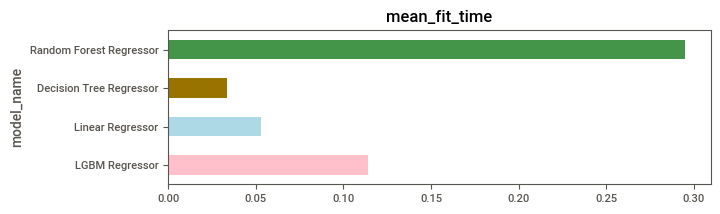

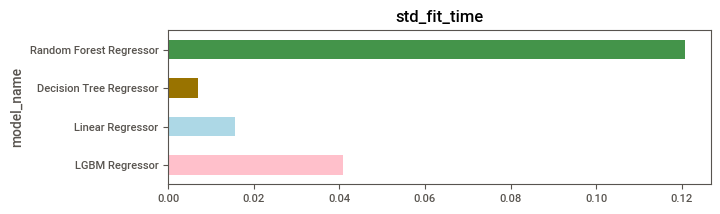

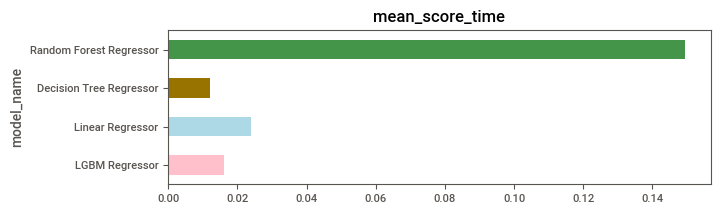

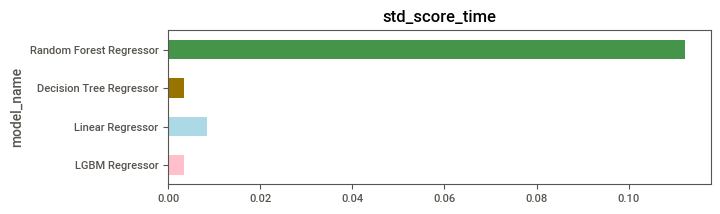

In [72]:
def show_models_results():
    [
        (
            models_results_df[["model_name", column]].plot(
                kind="barh",
                x="model_name",
                y=column,
                color=[
                    "pink",
                    "LightBlue",
                    "#997300",
                    "#44944a",
                    "violet",
                ],
                title=column,
                legend=None,
                figsize=(7, 2),
            ),
            plt.show(),
        )
        for column in [
            # "model_name",
            "mean_test_score",
            "std_test_score",
            "mean_fit_time",
            "std_fit_time",
            "mean_score_time",
            "std_score_time",
        ]
    ]
    print()


show_models_results()

Для дальнейшего тестирования выбираем модель получившую наименьший результат RMSE по модулю - <b>линейную регрессию</b> с RMSE порядка 21 на обучающей выборке.

## 1.4. Тестирование


Посмотрим на RMSE лучшей модели (LinearRegression) на тестовых данных:

In [73]:
mean_squared_error(
    data_test["num_orders"],
    rand_search_cv_lin.best_estimator_.predict(data_test.drop("num_orders", axis=1)),
    squared=False,
)

34.09016955217597

## 1.5. Выводы


Мы проанализировали различные модели для прогнозирования временных рядов, добавили во временной ряд дополнительные признаки (части даты, отстающие значения, скользящее среднее) для улучшения качества моделей. Лучше всего себя показала модель LinearRegression показав также на тестовой выборке RMSE порядка 34 (при требуемом максимуме 48). Кроме того, линейная регрессия является и практически самой быстрой из всех рассматриваемых моделей (на этом же уровне Decision Tree Regressor, но у него на кросс-валидации вышли гораздо бОльшие значения RMSE).